In [8]:
#!pip install -U gensim

In [7]:
#nltk.download('stopwords')
#nltk.download('punkt')
#nltk.download('averaged_perceptron_tagger')
#nltk.download('wordnet')

In [1]:
import pickle
with open('df_cleaned.pickle','rb') as read_file:
    df = pickle.load(read_file)
    
with open('low_occuring_words.pickle', 'rb') as read_file2:
    low_occuring_words = pickle.load(read_file2)

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# NLP
import re
import string
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.tokenize.treebank import TreebankWordDetokenizer
from nltk.probability import FreqDist
from gensim import corpora, models, similarities, matutils
from gensim.models import LsiModel
from gensim.models.coherencemodel import CoherenceModel

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [3]:
df.columns

Index(['country', 'description', 'designation', 'points', 'price', 'province',
       'region_1', 'region_2', 'taster_name', 'title', 'variety', 'winery',
       'vintage', 'log_price'],
      dtype='object')

# Clean text- lowercase, only alphanumeric, no punc

In [4]:
# # Helper lambda fx to remove numbers and make lowercase
alphanumeric = lambda x: re.sub('\w*\d\w*', ' ', x)
#remove_numbers = lambda x: re.sub("^\d+\s|\s\d+\s|\s\d+$", " ", x)
punc_lower = lambda x: re.sub('[%s]' % re.escape(string.punctuation), ' ', x.lower())

<>:2: DeprecationWarning: invalid escape sequence \w
<>:2: DeprecationWarning: invalid escape sequence \w
<>:2: DeprecationWarning: invalid escape sequence \w
<ipython-input-4-43b4bdde0d01>:2: DeprecationWarning: invalid escape sequence \w
  alphanumeric = lambda x: re.sub('\w*\d\w*', ' ', x)


In [5]:
# def clean_text(s):
#     '''Function to clean up special chars from strings, and make lower case'''
#     for c in ['{','}', '!','"', ",", ':', '/', "&", "-", "(", ")", ".", "@", "%", "--"]:
#         s=s.replace(c,'').lower()
#     return s.split(' ')

In [6]:
# def remove_nums(string): 
#     pattern = '[0-9]'
#     string = [re.sub(pattern, '', i) for i in string] 
#     return string

In [7]:
df.description.loc[38138]

"Cabernet Sauvignon (71%) is in the lead here followed by Merlot (24%) and Cabernet Franc. Brooding aromas of herb, smoke, cherry and spice are followed by an elegantly styled palate. Lightly crunchy tannins and tart acids provide support. It's a very pretty expression of this esteemed vineyard."

In [8]:
df['clean_desc'] = df['description'].apply(alphanumeric).apply(punc_lower)

In [9]:
# Check to make sure it worked
df['clean_desc'].loc[38138]

'cabernet sauvignon      is in the lead here followed by merlot      and cabernet franc  brooding aromas of herb  smoke  cherry and spice are followed by an elegantly styled palate  lightly crunchy tannins and tart acids provide support  it s a very pretty expression of this esteemed vineyard '

In [10]:
df['clean_desc'].sample(10)

20558     light in color this is a delicious pinot noir ...
2059      here s a vineyard designate barolo riserva wit...
21748     this barrel fermented rosé lives with the devi...
37366     a great syrah  from a winery better known for ...
46820     a dry rose  the color of onion skins  the aust...
12863     the meyer vineyard  in the red hills of dundee...
10525     lots of leesy  vanilla richness in this new wo...
43984     light  pale  tart  with generic  simple red be...
108965    hints of pungent boxwood mark the nose of this...
92405     raspberry  red currant and a pinch of oaky map...
Name: clean_desc, dtype: object

# Stop Words

In [11]:
#create a list of stop words
stop_words = set(stopwords.words("english"))

In [12]:
len(stop_words)

179

In [13]:
df.designation = df.designation.replace(999, 'a') # so no NaN / all strings. 'a' will get removed from stop words 

In [14]:
df.designation.sample(10)

83756        Reserve Dry
109539            Amfora
112081     Metricup Road
101437                 a
15411                Dry
86350     Edição Reserva
8036                   a
95388         Il Tabarro
96211     Coelho Estates
112014           Reserva
Name: designation, dtype: object

In [15]:
# # Make columns lowercase so we can add them to stop words and they catch the already lowercase tokenized desc.
# df.winery = df.winery.str.lower()
# df.variety = df.variety.str.lower()
# df.region_1 = df.region_1.str.lower()
# df.region_2 = df.region_2.str.lower()
#df.designation_list = df.designation.str.lower()
designations = df.designation.str.lower().to_list()

In [16]:
# Create list of words in designations column from original df
designation_list = []
for ele in designations:
    for j in ele.split(' '):
        designation_list.append(j)

In [17]:
designation_set = set(designation_list)

In [18]:
# Examine most common 4000 words from designation set so we can manually remove some if they may be good words
# that contribute to flavor profiles....might need to remove from original list not set

# Hard to remove this whole col without taking out some essential words like dry, fruit, fruity, sweet. Will examine
# the top and then remove those from list.

from collections import Counter

# Use this to print the word AND the count in a tuple
#most_common = [item for item in Counter(designation_list).most_common(300)]
#print(str(most_common))

x = [word for word, word_count in Counter(designation_list).most_common(4000)]

In [19]:
# Remove some description words from top 2000 so they are not stop words
designation_stop_words = [e for e in x if e not in \
                          ('cuvée','brut', 'dry', 'rosé', 'premier', 'blanc','crianza', 'vintage', 'blend'\
                          'kabinett', 'red', 'white', 'rosso', 'unoaked', 'pinot', 'noir', 'lie', 'terroir',\
                          'rose', 'cabernet', 'spätlese', 'semi-dry', 'rosado', 'stone', 'tree', 'cask', 'pink',\
                          'sauvignon', 'rouge', 'sur', 'blend', 'syrah', 'sec', 'demi-sec', 'sparkling', 'stone',\
                          'rosa', 'special', 'oak', 'fermented', 'merlot', 'semi-dry', 'pink', 'franc', 'dulce',\
                          'muscat', 'range', 'seco', 'vinho', 'champagne', 'cigare', 'spice', 'champenoise',\
                          'sweet', 'nose', 'black', 'red', 'small', 'sec', 'cask', 'five', 'zero', 'dessert',\
                          'sun', 'crémant', 'cream', 'olive', 'cherry', 'ferment', 'clover', 'clove', 'fine', \
                          'barrique', 'shiraz-cabernet', 'clay', 'painted','charming', 'ensemble', 'bordeaux',\
                          'metal', 'blonde', 'chocolate', 'truffle', 'synergy', 'full', 'sirah', 'selection', 'herb',\
                          "d'alsace", 'smooth', 'tons', 'only', 'grape', 'syrah-cabernet', 'kiss', 'fume', 'rosè',\
                          'yeast', 'sauvignon-syrah', 'viognier', 'bone', 'sancerre', 'cava', 'plum', 'grit', 'rot',\
                          'familiar', 'biodynamic', 'sustainable','intense', 'bubbly', 'rocks', 'elegance', 'barriques',\
                          'brown', 'off-dry', 'semi', 'seco', 'juicy', 'jammy', 'clover', 'beyond', 'deep','stainless',\
                          'chenin', 'olive', 'zinfandel', 'mélange', 'grace', 'oaks', 'smokey', 'smoke', 'wooded', 'beauty',\
                          'charming', 'earth', 'spice', 'backbone', 'pear', 'berry', 'finest', 'emotion', 'smoke',\
                          'violet', 'napa', 'ocean', 'velvet', 'pure', 'toasted', 'aromatic', 'truffle', 'grigio')]

# Designation stop words starts from top 2000, minus ^^

In [20]:
stop_words = set(stopwords.words("english"))

In [21]:
# Add designation words to stop list
# Add low_occuring_words list (created later, pickled, then rerun and used here)
stop_words = stop_words.union(designation_stop_words).union(low_occuring_words)

# Add extras that come up along inital models
stop_words = stop_words.union(['flavor', 'flavors', 'aroma', 'though', 'offer', 'palate', 'aromas', 'drink', 'pair',\
                               'palette', 'offers', 'seem', 'seems', 'fruity', 'fruits', 'need', 'fruity',\
                              'like'])

In [22]:
# Test to make sure unions worked
'grigio' in stop_words

False

# Pickle stop_words to use in other notebooks

In [23]:
with open ('stop_words.pickle', 'wb') as to_write:
    pickle.dump(stop_words, to_write)

## Lemmatization
- Stemming is too intense, mostly recommended to do lemmatization

In [24]:
# Detokenizer combines tokenized elements
detokenizer = TreebankWordDetokenizer()
def token_lemmat_detoken(desc):
    '''Tokenize the description column. Then apply lemmatization to EACH ELEMENT (list comp).\
    Then detokenize'''
    desc_token = word_tokenize(desc)            
    #stop_words_removed = [ for i in desc_token if i not in stop_words]
    lemmatizer = WordNetLemmatizer()
    #lem_text = [lemmatizer.lemmatize(i) for i in stop_words_removed]
    
    lem_text = [lemmatizer.lemmatize(i) for i in desc_token if i not in stop_words]
    #print(lem_text)
    #desc = [token for token in desc if token not in stop_words] # Not removing stop words here
    return detokenizer.detokenize(lem_text)



In [25]:
# Detokenizer combines tokenized elements
detokenizer = TreebankWordDetokenizer()
def token_stem_detoken(desc):
    '''Tokenize the description column. Then apply lemmatization to EACH ELEMENT (list comp).\
    Then detokenize'''
    desc_token = word_tokenize(desc)            
    #stop_words_removed = [ for i in desc_token if i not in stop_words]
    stemmer = PorterStemmer()
    #lem_text = [lemmatizer.lemmatize(i) for i in stop_words_removed]
    
    stem_text = [stemmer.stem(i) for i in desc_token if i not in stop_words]
    #print(lem_text)
    #desc = [token for token in desc if token not in stop_words] # Not removing stop words here
    return detokenizer.detokenize(stem_text)

In [26]:
# Test to make sure the main words are taken out
token_lemmat_detoken('this wine has lots of flavor. berry fruit lemon citrus offers black berries')

'lot . berry lemon citrus black berry'

In [27]:
# Test to make sure the main words are taken out
token_stem_detoken('this wine has lots of flavor. berry fruit lemon citrus offers black berries')

'lot . berri lemon citru black berri'

# Test on smaller DF
- Since DF is large and cleaning takes time, here I tested on a smaller subset of the main df

In [28]:
df_test = df.sample(40000)

In [29]:
# # Test on smaller
df_test['clean_test'] = df_test.description.apply(alphanumeric).apply(punc_lower)

In [30]:
df_test['stem_test'] = df_test['clean_test'].apply(token_stem_detoken)

In [31]:
df_test['lemmat_test'] = df_test['clean_test'].apply(token_lemmat_detoken)

In [32]:
df_test['lemmat_test'].sample(10)

30055     second rosa ripe smoothly soft tannin ample ac...
29358     apricot stone pleasing show elegance detail al...
56540     citrusy alcohol blend sémillon sauvignon blanc...
123594    clean polished give cabernet sauvignon austere...
37638     produce relatively small quantity blend bourbo...
124723    garnet color proffer plum flint lavender pleas...
115808    chocolate hint mint spice black make smelling ...
87374     crisp conveys red spice smooth texture given l...
60768     smoky hearty brunello recall cured beef moist ...
112377                   simple seemingly sweet apricot jam
Name: lemmat_test, dtype: object

# Pickle test df to work with later/test other models on

In [33]:
import pickle
with open ('df_test_cleaned.pickle', 'wb') as to_write:
    pickle.dump(df_test, to_write)

# Examine top words (post lemmatization / cleaning)- Smaller DF
- Graph / list

In [34]:
# word_occurrence = df_test['stem_test'].str.split(expand=True).stack().value_counts()
# total_words = sum(word_occurrence)

# #plot most common words 
# top_words = word_occurrence[:30]/total_words

# ax = sns.barplot(x = top_words.values, y = top_words.index)
# ax.set_title("Percent Occurrence of Most Frequent Words")
# plt.figure(figsize=(13, 13))

# plt.show()

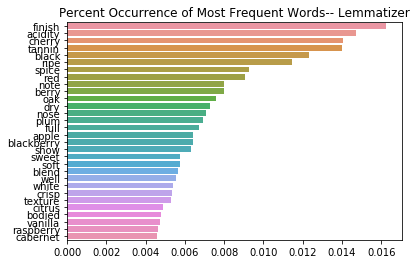

<Figure size 936x936 with 0 Axes>

In [35]:
word_occurrence = df_test['lemmat_test'].str.split(expand=True).stack().value_counts()
total_words = sum(word_occurrence)

#plot most common words 
top_words = word_occurrence[:30]/total_words

ax = sns.barplot(x = top_words.values, y = top_words.index)
ax.set_title("Percent Occurrence of Most Frequent Words-- Lemmatizer")
plt.figure(figsize=(13, 13))

plt.show()

## Remove very low occuring words
- Remove words that occur less than 4 times
- This was run here, then pickled, then used above. So commented out here. Not the best way but the easiest way to do so.

In [36]:
#df_test['lemmat_test'].str.split(expand=True).stack().value_counts()

In [37]:
#word_occurence_dict = word_occurrence.to_dict()

In [38]:
# low_occuring_words = []
# for k,v in word_occurence_dict.items():
#     if v <= 3: # Need to change this number when applying to larger DF
#         low_occuring_words.append(k)

In [39]:
# # Pickle list of low_occuring_words to use later. Need to get the list here then apply to cleaning above because
# # there is no way to get at this list before the previous steps. Easier to get here and apply earlier.

# with open ('low_occuring_words.pickle', 'wb') as to_write:
#     pickle.dump(low_occuring_words, to_write)

# Lemmatize/Stem description

In [40]:
# Apply lemmatization function to main DF
df['lemmat_desc'] = df['clean_desc'].apply(token_lemmat_detoken)

In [41]:
df['stem_desc'] = df['clean_desc'].apply(token_stem_detoken)

## Top words in lemmatized desc

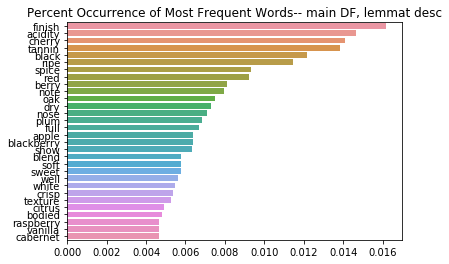

<Figure size 936x936 with 0 Axes>

In [42]:
word_occurrence = df["lemmat_desc"].str.split(expand=True).stack().value_counts()
total_words = sum(word_occurrence)

#plot most common words 
top_words = word_occurrence[:30]/total_words

ax = sns.barplot(x = top_words.values, y = top_words.index)
ax.set_title("Percent Occurrence of Most Frequent Words-- main DF, lemmat desc")
plt.figure(figsize=(13, 13))

plt.show();

In [43]:
# Number of words
len(df["lemmat_desc"].str.split(expand=True).stack())

2192429

In [44]:
print(df["lemmat_desc"].str.split(expand=True).stack().value_counts()[:50])

finish        35459
acidity       32118
cherry        30906
tannin        30381
black         26643
ripe          25071
spice         20491
red           20197
berry         17787
note          17462
oak           16392
dry           15976
nose          15509
plum          14999
full          14702
apple         13991
blackberry    13942
show          13838
blend         12662
soft          12642
sweet         12603
well          12367
white         11969
crisp         11735
texture       11513
citrus        10753
bodied        10506
raspberry     10219
vanilla       10200
cabernet      10164
hint          10131
herb          10037
bright        10033
touch          9247
lemon          9099
juicy          8957
firm           8497
give           8404
pear           8109
chocolate      8053
currant        8030
balanced       7819
feel           7666
dried          7362
sauvignon      7143
structure      7085
open           6788
spicy          6700
fine           6670
smooth         6667


## Top words in stemmed desc

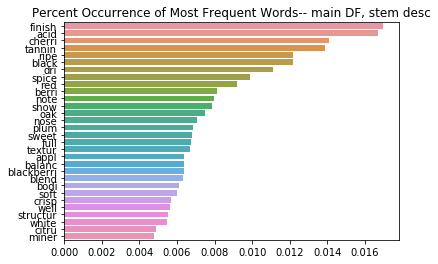

<Figure size 936x936 with 0 Axes>

In [45]:
word_occurrence = df["stem_desc"].str.split(expand=True).stack().value_counts()
total_words = sum(word_occurrence)

#plot most common words 
top_words = word_occurrence[:30]/total_words

ax = sns.barplot(x = top_words.values, y = top_words.index)
ax.set_title("Percent Occurrence of Most Frequent Words-- main DF, stem desc")
plt.figure(figsize=(13, 13))

plt.show();

In [46]:
len(df["stem_desc"].str.split(expand=True).stack())

2192429

# Pickle df
- Includes stemmed + lemmat description columns


In [47]:
with open ('df_cleaned_final.pickle', 'wb') as to_write:
    pickle.dump(df, to_write)

# LDA-- Test base models
- Testing a few base models with CV, TFIDF, various ngram lengths, stemmed vs lemmat
- Next notebook will further explore best models

## Lemmatization LDA models

In [75]:
# BELOW ARE TESTS DONE ON SMALLER DFS FOR TIME SAVING-- DNU ONCE COMMENTED OUT

### 1 gram CV model with lemmat description

# cv_test_lemmat = CountVectorizer()

# cv_test_lemmat_desc = cv_test_lemmat.fit_transform(df_test['lemmat_test'])

# doc_word_cv_test_lemmat = cv_test_lemmat_desc.transpose()

# corpus_test_lemmat = matutils.Sparse2Corpus(doc_word_cv_test_lemmat)

# id2word_cv_test_lemmat = dict((v, k) for k, v in cv_test_lemmat.vocabulary_.items())


### 1,2 gram model, lemmat desc

In [72]:
# 1,2 gram with CV on lemmat_desc
cv_lemmat_2 = CountVectorizer(ngram_range=(1,2), min_df=2, max_df = .5) 
# Adding a min of 2 docs reduces the corpus by 2/3...Prob good b/c Do we really want words that only appear in 1 doc?

cv_lemmat_desc_2 = cv_lemmat_2.fit_transform(df['lemmat_desc']) #aka doc_topic

doc_word_cv_lemmat_2 = cv_lemmat_desc_2.transpose()

corpus_lemmat_2 = matutils.Sparse2Corpus(doc_word_cv_lemmat_2)

id2word_cv_lemmat_2 = dict((v, k) for k, v in cv_lemmat_2.vocabulary_.items())


In [73]:
cv_lemmat_desc_2.shape

(119988, 213101)

In [74]:
# Run Model
lda_cv_lemmat_2 = models.LdaModel(corpus=corpus_lemmat_2, num_topics=15, id2word=id2word_cv_lemmat_2, passes=15)

In [76]:
# Topics from model
lda_cv_lemmat_2.print_topics() # Not bad-- maybe tweek some of the very common words down..

[(0,
  '0.013*"bitterness" + 0.010*"across" + 0.010*"come" + 0.006*"berry finish" + 0.006*"blast" + 0.006*"herbal note" + 0.006*"lychee" + 0.005*"touch spice" + 0.005*"come across" + 0.005*"standard"'),
 (1,
  '0.045*"black" + 0.043*"blackberry" + 0.022*"chocolate" + 0.021*"cherry" + 0.014*"tannin" + 0.014*"black cherry" + 0.013*"nose" + 0.013*"show" + 0.012*"tannic" + 0.011*"blueberry"'),
 (2,
  '0.052*"cherry" + 0.034*"spice" + 0.031*"red" + 0.020*"note" + 0.018*"raspberry" + 0.016*"finish" + 0.013*"show" + 0.012*"tart" + 0.012*"cranberry" + 0.011*"herb"'),
 (3,
  '0.055*"acidity" + 0.036*"ripe" + 0.029*"soft" + 0.026*"red" + 0.024*"texture" + 0.023*"crisp" + 0.019*"ready" + 0.016*"attractive" + 0.014*"give" + 0.013*"touch"'),
 (4,
  '0.012*"yet" + 0.009*"tea" + 0.008*"floral" + 0.008*"length" + 0.007*"mix" + 0.006*"hint" + 0.006*"add" + 0.006*"highlight" + 0.006*"pinot" + 0.006*"vintage"'),
 (5,
  '0.090*"cabernet" + 0.062*"blend" + 0.049*"merlot" + 0.046*"sauvignon" + 0.044*"cabern

In [66]:
# ### Pickle lda_cv_test_lemmat_2 to mess with later for testing
# with open ('lda_cv_test_lemmat_2.pickle', 'wb') as to_write:
#     pickle.dump(lda_cv_test_lemmat_2, to_write)

# Tfidf (2,3 gram range) on lemmat_desc

In [125]:
### 2,3 gram with TFIDF on lemmat_desc
tfidf_23 = TfidfVectorizer(ngram_range=(2,3), min_df=2, max_df=.5, binary=False)
tfidf_23_fit = tfidf_23.fit_transform(df['lemmat_desc'])
doc_word_tfidf_23 = tfidf_23_fit.transpose()
corpus_tfidf = matutils.Sparse2Corpus(doc_word_tfidf_23)
id2word_tfidf_23 = dict((v, k) for k, v in tfidf_23.vocabulary_.items())

In [126]:
tfidf_23_fit.shape

(119988, 348360)

In [128]:
lda_tfidf_23 = models.LdaModel(corpus=corpus_tfidf, num_topics=15, id2word=id2word_tfidf_23, passes=15)

In [130]:
lda_tfidf_23.print_topics()

[(0,
  '0.003*"sauvignon blanc" + 0.002*"lemon apple" + 0.002*"crisp clean" + 0.002*"sweet simple" + 0.001*"blend sauvignon" + 0.001*"cranberry raspberry" + 0.001*"finish sweet" + 0.001*"lengthy finish" + 0.001*"sharp acidity" + 0.001*"blend sauvignon blanc"'),
 (1,
  '0.003*"blackberry black currant" + 0.003*"blackberry black" + 0.002*"acidity balance" + 0.002*"black currant" + 0.002*"sweet oak" + 0.002*"vibrant acidity" + 0.002*"coffee bean" + 0.002*"tightly wound" + 0.001*"soft simple" + 0.001*"provide framework"'),
 (2,
  '0.002*"black cherry" + 0.002*"crushed raspberry" + 0.002*"cherry crushed" + 0.002*"juicy black cherry" + 0.002*"berry plum" + 0.002*"ripe tropical" + 0.002*"juicy black" + 0.002*"add complexity" + 0.002*"sweet finish" + 0.001*"integrated oak"'),
 (3,
  '0.002*"lemon lime" + 0.002*"plum berry" + 0.002*"lime acidity" + 0.002*"dry tannin" + 0.002*"plum raspberry" + 0.002*"berry cherry" + 0.002*"acidity finish" + 0.002*"hard tannin" + 0.002*"strawberry raspberry" + 0

# Further tests before trying Gensim steps in other notebook

## CountVectorizer: a) regular b) ngrams, binary
- Both versions here are with regular stop words. Will apply dif stop words later
- After this see which are most common words and see if they need to be classified as stop words

In [78]:
# Stop words have been removed already at this point. SO NO NEED TO RE ADD TO MODELS HERE
cv1 = CountVectorizer()
cv2 = CountVectorizer(ngram_range=(1,2), token_pattern="\\b[a-z][a-z]+\\b")
# Can try binary = True model too

### With lemmat desc

In [80]:
cv1_lemmat_desc = cv1.fit_transform(df['lemmat_desc'])
cv2_lemmat_desc = cv2.fit_transform(df['lemmat_desc'])

### With stemmed desc

In [41]:
# cv1_stemmed_desc = cv1.fit_transform(df['stem_desc'])
# cv2_stemmed_desc = cv2.fit_transform(df['stem_desc'])

### Create term-document matrix, transpose so terms are rows

In [81]:
cv2_lemmat_desc.shape

(119988, 651376)

In [73]:
doc_word_cv1_lemmat = cv1_lemmat_desc.transpose()
#doc_word_cv1_stemmed = cv1_stemmed_desc.transpose()
doc_word_cv2_lemmat = cv2_lemmat_desc.transpose()
#doc_word_cv2_stemmed = cv2_stemmed_desc.transpose()

In [74]:
# # View in a DF
# pd.DataFrame(doc_word_1.toarray(), cv1_lemmat_desc.get_feature_names()).head()
# No 'get_feature_names' if using fit_transform, so will skip this step...

In [75]:
print(doc_word_cv1_lemmat.shape)
#print(doc_word_cv1_stemmed.shape)
print(doc_word_cv2_lemmat.shape)
#print(doc_word_cv2_stemmed.shape)

(26385, 119988)
(677979, 119988)


### Convert to gensim

In [76]:
# Convert sparse matrix of counts to a gensim corpus
corpus_cv1_lemmat = matutils.Sparse2Corpus(doc_word_cv1_lemmat)
corpus_cv2_lemmat = matutils.Sparse2Corpus(doc_word_cv2_lemmat)

In [77]:
corpus_cv2_lemmat

### Map matrix rows to words(tokens)
- Need to save a dict/mapping of row id to word(token) for later use by gensim

In [78]:
id2word_cv1 = dict((v, k) for k, v in cv1.vocabulary_.items())
id2word_cv2 = dict((v, k) for k, v in cv2.vocabulary_.items())

In [79]:
id2word_cv2.items()

dict_items([(33701, 'aroma'), (301806, 'include'), (630016, 'tropical'), (251283, 'fruit'), (85391, 'broom'), (82186, 'brimstone'), (177527, 'dried'), (286828, 'herb'), (423814, 'palate'), (419411, 'overly'), (210659, 'expressive'), (410621, 'offering'), (639049, 'unripened'), (29691, 'apple'), (114698, 'citrus'), (19327, 'alongside'), (83912, 'brisk'), (5076, 'acidity'), (34840, 'aroma include'), (302028, 'include tropical'), (630127, 'tropical fruit'), (251698, 'fruit broom'), (85401, 'broom brimstone'), (82196, 'brimstone dried'), (177699, 'dried herb'), (287613, 'herb palate'), (425558, 'palate overly'), (419468, 'overly expressive'), (210821, 'expressive offering'), (411400, 'offering unripened'), (639051, 'unripened apple'), (29902, 'apple citrus'), (115006, 'citrus dried'), (177536, 'dried alongside'), (19382, 'alongside brisk'), (83917, 'brisk acidity'), (497636, 'ripe'), (255967, 'fruity'), (545844, 'smooth'), (569336, 'still'), (576861, 'structured'), (228022, 'firm'), (59905

In [ ]:
# Run first with 2,3 ngram model
lda_cv2_lemmat = models.LdaModel(corpus=corpus_cv2_lemmat, num_topics=20, id2word=id2word_cv2, passes=30)

In [90]:
lda_cv1_lemmat.print_topics()

[(0,
  '0.042*"noriet" + 0.030*"bottings" + 0.022*"paintings" + 0.015*"shouldered" + 0.013*"sinful" + 0.012*"drenches" + 0.010*"villages" + 0.008*"torretesta" + 0.008*"lies" + 0.008*"brotte"'),
 (1,
  '0.034*"bize" + 0.024*"cabaços" + 0.024*"flattery" + 0.024*"frothes" + 0.022*"chequered" + 0.021*"william" + 0.020*"tangerines" + 0.019*"bled" + 0.019*"dardi" + 0.018*"finer"'),
 (2,
  '0.080*"william" + 0.033*"drift" + 0.032*"acidity" + 0.025*"ringberg" + 0.023*"frothes" + 0.023*"fruist" + 0.020*"tangerines" + 0.017*"rianie" + 0.014*"chappelle" + 0.014*"flattery"'),
 (3,
  '0.033*"frothes" + 0.031*"william" + 0.016*"villages" + 0.016*"nuttier" + 0.012*"nettle" + 0.010*"lies" + 0.008*"freeman" + 0.008*"vincelles" + 0.007*"tapping" + 0.007*"barrantes"'),
 (4,
  '0.046*"flattery" + 0.039*"finer" + 0.038*"aromaas" + 0.025*"berried" + 0.023*"paintings" + 0.019*"pliable" + 0.015*"henriets" + 0.014*"frothes" + 0.011*"federica" + 0.011*"nosed"'),
 (5,
  '0.039*"paintings" + 0.034*"aromaas" + 0.0

### Before running these (taking a long time), examine the first lda, then maybe try CV with LSA + NMF

In [ ]:
#lda_cv2_lemmat = models.LdaModel(corpus=corpus_cv2_lemmat, num_topics=10, id2word=id2word_cv2, passes=30)

In [ ]:
#lda_cv1_stemm = models.LdaModel(corpus=corpus_cv1_stemmed, num_topics=10, id2word=id2word_cv1, passes=30)

In [ ]:
#lda_cv2_stemm = models.LdaModel(corpus=corpus_cv2_stemmed, num_topics=10, id2word=id2word_cv2, passes=30)

# Other models (with TFIDF) in 3rd notebook/ Gensim models

In [25]:
# tfidf1 = TfidfVectorizer(stop_words=stop_words)
# tfidf2 = TfidfVectorizer(ngram_range=(1,2), binary=True,stop_words=stop_words)

In [85]:
# tfidf1_fit_transform = tfidf1.fit_transform(df.description)
# tfidf2_fit_transform = tfidf2.fit_transform(df.description)